<a href="https://colab.research.google.com/github/arthursl12/POC1/blob/main/POC2_FD001_MLP_SHAP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [1]:
%pip install scikeras;
%pip install -U tensorflow-addons;
%pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 8.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 4.8 MB/s 


In [2]:
import shap

In [3]:
import os
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import glob
from datetime import datetime

In [4]:
from sklearn.pipeline import Pipeline
from sklearn.compose import TransformedTargetRegressor

from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from sklearn.base import BaseEstimator,RegressorMixin

In [5]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout

from tensorflow.keras.metrics import RootMeanSquaredError as RMSE

from keras.callbacks import LambdaCallback
from tensorflow.keras.optimizers import SGD, Adam, RMSprop
from tensorflow.keras.optimizers.schedules import ExponentialDecay

import tensorflow_addons as tfa
from tensorflow_addons.metrics import RSquare as R2



from scikeras.wrappers import KerasRegressor

In [6]:
sns.set_palette('colorblind')

In [7]:
# Reproducibility
seed = 42
os.environ['PYTHONHASHSEED']=str(seed)
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

In [8]:
tf.config.experimental.enable_op_determinism()

# Data Preparation

In [9]:
if 'google.colab' in str(get_ipython()):
    print('Running on CoLab')
    IN_COLAB = True
    folder="/content/CMaps/"

    # Dataset Download 
    os.system('git clone https://github.com/arthursl12/dataset_2')
    os.system('mv /content/dataset_2/CMaps /content/CMaps')
    os.system('mv /content/dataset_2/data_processing /content/data_processing')
    os.system('rm -rf dataset_2')
else:
    print('Not running on CoLab')
    IN_COLAB = False
    folder="CMaps/"
    %cd dataset_2/

Running on CoLab


In [10]:
from data_processing.processing import DatasetProcessing
from data_processing.training import HyperparameterSearch, reclipper_scorer
from data_processing.eval import Evaluation

In [11]:
proc = DatasetProcessing()

## Data Integration

The data are provided as a zip-compressed text file with 26 columns of numbers, separated by spaces. Each row is a snapshot of data taken during a single operational cycle, each column is a different variable. The columns correspond to:  

1) unit number   
2) time, in cycles  
3) operational setting 1  
4) operational setting 2  
5) operational setting 3    
6) sensor measurement 1    
7) sensor measurement 2  
...  
26) sensor measurement 20


There are 6 conditions (or combinations) which the 3 operational settings can take.  
Condition 1: Altitude = 0, Mach Number = 0, TRA = 100  
Condition 2: Altitude = 10, Mach Number = 0.25, TRA = 100  
Condition 3: Altitude = 20, Mach Number = 0.7 TRA = 100  
Condition 4: Altitude = 25, Mach Number = 0.62, TRA = 60  
Condition 5: Altitude = 35 Mach Number = 0.84, TRA = 100  
Condition 6: Altitude = 42, Mach Number = 0.84, TRA = 100  
  
There is slight variation in all these conditions so you may get numbers like 24.453 instead of 25 exactly.

FD001: Condition 1 only  
FD002: Mix of all the conditions  
FD003: Condition 1 only  
FD004: Mix of all conditions  


In [12]:
index_cols, settings_cols, sensors_cols, cols = proc.column_names()
train, test, y_test = proc.read_dataset(1,folder=folder)
train

,unit_number,time,op_1,op_2,op_3,s_0,s_1,s_2,s_3,s_4,...,s_11,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640


## Preprocessing

### Validation Set

In [13]:
from sklearn.model_selection import GroupShuffleSplit

def train_val_split(train):
    gss = GroupShuffleSplit(n_splits=1, train_size=0.80, random_state=42)  
    for idx_train, idx_val in gss.split(train,groups=train["unit_number"]):
        # print('train_split_engines', train.iloc[idx_train]['unit_number'].unique(), '\n')
        # print('validate_split_engines', train.iloc[idx_val]['unit_number'].unique(), '\n')

        df_train = train.iloc[idx_train].copy()
        df_val = train.iloc[idx_val].copy()

    return df_train, df_val

In [14]:
df_train, df_val = train_val_split(train)

In [15]:
X_t_train, y_t_train = proc.X_y_train_divide(df_train)
X_t_val, y_t_val = proc.X_y_train_divide(df_val)

### Test Set Transformation 
Test set has samples for all cycles, but has annotations only for last one

In [16]:
test.shape, y_test.shape

((13096, 26), (100, 1))

In [17]:
test_last = proc.transform_test(test)
test_last.head()

,s_0,s_1,s_2,s_3,s_4,s_5,s_6,s_7,s_8,s_9,...,s_11,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20
0,518.67,642.58,1581.22,1398.91,14.62,21.61,554.42,2388.08,9056.40,1.3,...,521.79,2388.06,8130.11,8.4024,0.03,393,2388,100.0,38.81,23.3552
1,518.67,642.55,1586.59,1410.83,14.62,21.61,553.52,2388.10,9044.77,1.3,...,521.74,2388.09,8126.90,8.4505,0.03,391,2388,100.0,38.81,23.2618
2,518.67,642.88,1589.75,1418.89,14.62,21.61,552.59,2388.16,9049.26,1.3,...,520.83,2388.14,8131.46,8.4119,0.03,395,2388,100.0,38.93,23.2740
3,518.67,642.78,1594.53,1406.88,14.62,21.61,552.64,2388.13,9051.30,1.3,...,521.88,2388.11,8133.64,8.4634,0.03,395,2388,100.0,38.58,23.2581
4,518.67,642.27,1589.94,1419.36,14.62,21.61,553.29,2388.10,9053.99,1.3,...,521.00,2388.15,8125.74,8.4362,0.03,394,2388,100.0,38.75,23.4117


In [18]:
X_test = test_last

### Remaining Useful Life (RUL)

In [19]:
train = proc.add_remaining_useful_life_linear(train)
train[index_cols+['RUL']].head()

,unit_number,time,RUL
0,1,1,191
1,1,2,190
2,1,3,189
3,1,4,188
4,1,5,187


## Attributes and target separation

In [20]:
X_train, y_train = proc.X_y_train_divide(train)

In [21]:
y_train.head()

,RUL
0,191
1,190
2,189
3,188
4,187


In [22]:
X_train.head()

,s_0,s_1,s_2,s_3,s_4,s_5,s_6,s_7,s_8,s_9,...,s_11,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20
0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,1.3,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


## Training and Evaluation functions

In [23]:
eval = Evaluation()

In [24]:
search = HyperparameterSearch()

## Sensor Dictionary

In [25]:
sensor_dictionary = {
    "s_0": "T2 (s_0)",
    "s_1": "T24 (s_1)",
    "s_2": "T30 (s_2)",
    "s_3": "T50 (s_3)",
    "s_4": "P2 (s_4)",
    "s_5": "P15 (s_5)",
    "s_6": "P30 (s_6)",
    "s_7": "Nf (s_7)",
    "s_8": "Nc (s_8)",
    "s_9": "epr (s_9)",
    "s_10": "Ps30 (s_10)",
    "s_11": "phi (s_11)",
    "s_12": "NRf (s_12)",
    "s_13": "NRc (s_13)",
    "s_14": "BPR (s_14)",
    "s_15": "farB (s_15)",
    "s_16": "htBleed (s_16)",
    "s_17": "Nf_dmd (s_17)",
    "s_18": "PCNfR_dmd (s_18)",
    "s_19": "W31 (s_19)",
    "s_20": "W32 (s_20)"
}
sensor_dictionary.values()

dict_values(['T2 (s_0)', 'T24 (s_1)', 'T30 (s_2)', 'T50 (s_3)', 'P2 (s_4)', 'P15 (s_5)', 'P30 (s_6)', 'Nf (s_7)', 'Nc (s_8)', 'epr (s_9)', 'Ps30 (s_10)', 'phi (s_11)', 'NRf (s_12)', 'NRc (s_13)', 'BPR (s_14)', 'farB (s_15)', 'htBleed (s_16)', 'Nf_dmd (s_17)', 'PCNfR_dmd (s_18)', 'W31 (s_19)', 'W32 (s_20)'])

In [26]:
X_train.columns = sensor_dictionary.values()
X_train

,T2 (s_0),T24 (s_1),T30 (s_2),T50 (s_3),P2 (s_4),P15 (s_5),P30 (s_6),Nf (s_7),Nc (s_8),epr (s_9),...,phi (s_11),NRf (s_12),NRc (s_13),BPR (s_14),farB (s_15),htBleed (s_16),Nf_dmd (s_17),PCNfR_dmd (s_18),W31 (s_19),W32 (s_20)
0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,1.3,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,518.67,643.49,1597.98,1428.63,14.62,21.61,551.43,2388.19,9065.52,1.3,...,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735
20627,518.67,643.54,1604.50,1433.58,14.62,21.61,550.86,2388.23,9065.11,1.3,...,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594
20628,518.67,643.42,1602.46,1428.18,14.62,21.61,550.94,2388.24,9065.90,1.3,...,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333
20629,518.67,643.23,1605.26,1426.53,14.62,21.61,550.68,2388.25,9073.72,1.3,...,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640


In [27]:
X_test.columns = sensor_dictionary.values()
X_test

,T2 (s_0),T24 (s_1),T30 (s_2),T50 (s_3),P2 (s_4),P15 (s_5),P30 (s_6),Nf (s_7),Nc (s_8),epr (s_9),...,phi (s_11),NRf (s_12),NRc (s_13),BPR (s_14),farB (s_15),htBleed (s_16),Nf_dmd (s_17),PCNfR_dmd (s_18),W31 (s_19),W32 (s_20)
0,518.67,642.58,1581.22,1398.91,14.62,21.61,554.42,2388.08,9056.40,1.3,...,521.79,2388.06,8130.11,8.4024,0.03,393,2388,100.0,38.81,23.3552
1,518.67,642.55,1586.59,1410.83,14.62,21.61,553.52,2388.10,9044.77,1.3,...,521.74,2388.09,8126.90,8.4505,0.03,391,2388,100.0,38.81,23.2618
2,518.67,642.88,1589.75,1418.89,14.62,21.61,552.59,2388.16,9049.26,1.3,...,520.83,2388.14,8131.46,8.4119,0.03,395,2388,100.0,38.93,23.2740
3,518.67,642.78,1594.53,1406.88,14.62,21.61,552.64,2388.13,9051.30,1.3,...,521.88,2388.11,8133.64,8.4634,0.03,395,2388,100.0,38.58,23.2581
4,518.67,642.27,1589.94,1419.36,14.62,21.61,553.29,2388.10,9053.99,1.3,...,521.00,2388.15,8125.74,8.4362,0.03,394,2388,100.0,38.75,23.4117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,518.67,642.30,1590.88,1397.94,14.62,21.61,553.99,2388.03,9062.41,1.3,...,522.30,2388.01,8148.24,8.4110,0.03,391,2388,100.0,38.96,23.4606
96,518.67,642.59,1582.96,1410.92,14.62,21.61,554.05,2388.06,9076.36,1.3,...,521.58,2388.06,8155.48,8.4500,0.03,395,2388,100.0,38.61,23.2953
97,518.67,642.68,1599.51,1415.47,14.62,21.61,553.44,2388.13,9062.34,1.3,...,521.53,2388.09,8146.39,8.4235,0.03,394,2388,100.0,38.76,23.3608
98,518.67,642.00,1585.03,1397.98,14.62,21.61,554.75,2388.01,9067.16,1.3,...,521.82,2388.02,8150.38,8.4003,0.03,391,2388,100.0,38.95,23.3595


# MLP Construction

## Callbacks

In [28]:
# Early Stopping Callback
es = tf.keras.callbacks.EarlyStopping(monitor='loss', 
                                      patience=5, restore_best_weights=True)

In [29]:
# Printing Callback
def printLog(epoch, logs):
    print(
        f"E {epoch+1}\t: loss={logs['loss']:.3f}, "+
        f"rmse={logs['root_mean_squared_error']:.3f}, "+
        f"r2={logs['r_square']:.3f}; "+
        f"v_loss={logs['val_loss']:.3f}, "+
        f"v_rmse={logs['val_root_mean_squared_error']:.3f}, "+
        f"v_r2={logs['val_r_square']:.3f}; "
    )

printerCallback = LambdaCallback(on_epoch_end=printLog)

## Auxiliary HyperParameters

In [30]:
layer_sizes=[16,32,64,128,256,512]

In [31]:
# Exponential Decay Schedules
ED1 = ExponentialDecay(initial_learning_rate=1e-2, name="ED1",
                       decay_steps=100000, decay_rate=0.96)
ED2 = ExponentialDecay(initial_learning_rate=1e-2, name="ED2",
                       decay_steps=100000, decay_rate=0.8)
ED3 = ExponentialDecay(initial_learning_rate=1e-1, name="ED3",
                       decay_steps=100000, decay_rate=0.96)

In [32]:
# Generation of list combinations
from itertools import chain, permutations

def all_permutations(lst, size):
    result = list(chain.from_iterable([permutations(lst, x) for x in range(len(lst)+1)]))
    out = []
    for r in result:
        if (len(r) == size):
            out.append(list(r))
    return out

## Constants

In [33]:
# X_train must include indices
train3 = train.copy()
X_train_ = train3.drop(columns=[index_cols[1]]+["RUL"])
X_train_.columns

Index(['unit_number', 'op_1', 'op_2', 'op_3', 's_0', 's_1', 's_2', 's_3',
       's_4', 's_5', 's_6', 's_7', 's_8', 's_9', 's_10', 's_11', 's_12',
       's_13', 's_14', 's_15', 's_16', 's_17', 's_18', 's_19', 's_20'],
      dtype='object')

In [34]:
X_train_.columns = [index_cols[0]]+settings_cols+list(sensor_dictionary.values())
X_train_.columns

Index(['unit_number', 'op_1', 'op_2', 'op_3', 'T2 (s_0)', 'T24 (s_1)',
       'T30 (s_2)', 'T50 (s_3)', 'P2 (s_4)', 'P15 (s_5)', 'P30 (s_6)',
       'Nf (s_7)', 'Nc (s_8)', 'epr (s_9)', 'Ps30 (s_10)', 'phi (s_11)',
       'NRf (s_12)', 'NRc (s_13)', 'BPR (s_14)', 'farB (s_15)',
       'htBleed (s_16)', 'Nf_dmd (s_17)', 'PCNfR_dmd (s_18)', 'W31 (s_19)',
       'W32 (s_20)'],
      dtype='object')

In [35]:
sensors_cols = list(sensor_dictionary.values())

In [36]:
INPUT_SHAPE = 0

## Wrapper

In [37]:
from sys import is_finalizing
from sklearn.metrics import r2_score

class MLPWrapperRegressor(BaseEstimator,RegressorMixin):
    def __init__(self, basemodel=None, clip_y=-1,
                 include_settings=False, poly_degree=1,
                 scaler=StandardScaler()):
        # Base parameters
        self.basemodel = basemodel
        self.clip_y = clip_y
        self.poly_degree = poly_degree
        self.include_settings = include_settings

        # Column indexers
        self.feature_cols = sensors_cols
        if(include_settings):
            self.feature_cols = settings_cols + self.feature_cols
        self.base_feature_cols = self.feature_cols

        # Scaler and PolyFeatures transformers
        self.scaler = scaler
        self.polyft = PolynomialFeatures(degree=self.poly_degree, 
                                         include_bias=False)

    def clean_cols(self,df):
        if("unit_number" in df.columns): del df["unit_number"]
        if("unit_number" in df.columns): del df["unit_number"]
        if("time" in df.columns): del df["time"]
        if((not self.include_settings)): 
            for col in settings_cols:
                if(col in df.columns): del df[col]
        return df

    def fit(self, X=None, y=None):
        # Drop irrelevant column
        data = pd.DataFrame(X).copy()
        data = self.clean_cols(data)
        
        # Apply polynomial features and add them to the dataframe
        transf = self.polyft.fit_transform(data)
        data = pd.DataFrame(transf, columns=
                              self.polyft.get_feature_names_out())
        self.feature_cols = list(self.polyft.get_feature_names_out())

        # Scale the data
        data = self.scaler.fit_transform(data)
        data = pd.DataFrame(data, 
                            columns=self.scaler.get_feature_names_out())
        X_train = data.copy()
        
        # Clip and transform labels
        data2 = pd.DataFrame(y, columns=["RUL"]).copy()
        if (self.clip_y > 0):
            data2["RUL"].clip(upper=self.clip_y, inplace=True)
        y_train = data2

        # Update input shape for future use
        global INPUT_SHAPE
        INPUT_SHAPE = X_train.shape[1]

        # Fit model
        self.basemodel.fit(X_train,y_train)
        return self
        
    def predict(self, X=None):
        # Perform transformation, if not done
        if (len(X.columns) != len(self.feature_cols)):
            X_train = self.transform_features(X)
        else:
            X_train = X
        return self.basemodel.predict(X_train)

    def transform_features(self, df):
        # Drop irrelevant column
        data = pd.DataFrame(df).copy()
        data = self.clean_cols(data)
        
        # Apply polynomial features and add them to the dataframe
        transf = self.polyft.transform(data)
        data = pd.DataFrame(transf, columns=
                              self.polyft.get_feature_names_out())
        # self.feature_cols = list(self.polyft.get_feature_names_out())

        # Scale the data
        data = self.scaler.transform(data)
        data = pd.DataFrame(data, 
                            columns=self.scaler.get_feature_names_out())
        return data

    def score(self, X, y, sample_weight=None):
        X_test = self.transform_features(X)

        # Clip and transform labels
        data2 = pd.DataFrame(y, columns=["RUL"]).copy()
        if (self.clip_y > 0):
            data2["RUL"].clip(upper=self.clip_y, inplace=True)
        y_test = data2

        # Predict on test data
        y_pred = self.predict(X_test)
        return r2_score(y_test, y_pred, sample_weight=sample_weight)

## Test Data

In [38]:
def scale_test(test,model):
    test2 = pd.DataFrame(test)
    test2 = model.clean_cols(test2)

    # Apply polynomial features
    transf = model.polyft.transform(test2)
    test2 = pd.DataFrame(transf, 
                         columns=model.polyft.get_feature_names_out())

    # Scale the data (with train data parameters)
    test2 = model.scaler.transform(test2)
    test2 = pd.DataFrame(test2, 
                         columns=model.polyft.get_feature_names_out())
    return test2

## Constructor

In [39]:
def create_model(optim=Adam, learning_rate=1e-3, 
                 layer1=32  , activation1="tanh"    , dropout1=0.1,
                 layer2=None, activation2="tanh"    , dropout2=0.1,
                 layer3=None, activation3="tanh"    , dropout3=0.1,
                 layer4=None, activation4="tanh"    , dropout4=0.1,
                 print_summary=False, loss='mean_squared_error',
                 metrics=[tf.keras.metrics.MeanSquaredError()]):
    model = Sequential()

    # Fully Connected Layer
    model.add(Dense(layer1, input_dim=INPUT_SHAPE, activation=activation1))
    model.add(Dropout(dropout1))

    # Additional hidden layers
    if(layer2 is not None):
        model.add(Dense(layer2, activation=activation2))
        model.add(Dropout(dropout2))
        if (layer3 is not None):
            model.add(Dense(layer3, activation=activation3))
            model.add(Dropout(dropout3))
            if (layer4 is not None):
                model.add(Dense(layer4, activation=activation4))
                model.add(Dropout(dropout4))

    # Output Layer
    model.add(Dense(1))

    model.compile(loss=loss, optimizer=optim(learning_rate=learning_rate), 
                  metrics=metrics)
    
    if(print_summary): model.summary()
    return model

# Model (with Poly)

In [49]:
CLIP=80

model = MLPWrapperRegressor(
        clip_y=CLIP, scaler=StandardScaler(), poly_degree=2,
        basemodel=
            KerasRegressor(model=create_model,
                           batch_size=283,
                           epochs=14,
                           model__activation1='tanh',
                           model__activation2='relu',
                           model__activation3='elu',
                           model__dropout1=0.1, 
                           model__dropout2=0.53425143831743, 
                           model__dropout3=0.1, 
                           model__layer1=512, 
                           model__layer2=512, 
                           model__layer3=305, 
                           model__learning_rate=0.009573430971057319,
                           model__optim=Adam,
                           validation_split=0.1, 
                           verbose=0, callbacks=[es, printerCallback],
                           model__metrics=[RMSE(), R2()],
                           model__loss='mse',
                           print_summary=True
                           )
    )
model.fit(X_train_, y_train)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 512)               129536    
                                                                 
 dropout_3 (Dropout)         (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 512)               262656    
                                                                 
 dropout_4 (Dropout)         (None, 512)               0         
                                                                 
 dense_6 (Dense)             (None, 305)               156465    
                                                                 
 dropout_5 (Dropout)         (None, 305)               0         
                                                                 
 dense_7 (Dense)             (None, 1)                

MLPWrapperRegressor(basemodel=KerasRegressor(batch_size=283, callbacks=[<keras.callbacks.EarlyStopping object at 0x7f456db078d0>, <keras.callbacks.LambdaCallback object at 0x7f456daf9bd0>], epochs=14, model=<function create_model at 0x7f456daf8710>, model__activation1='tanh', model__activation2='relu', model__activation3='elu', model__dropout1=0.1, model__dropout2=0...5, model__learning_rate=0.009573430971057319, model__loss='mse', model__metrics=[<keras.metrics.metrics.RootMeanSquaredError object at 0x7f44e6074f10>, <tensorflow_addons.metrics.r_square.RSquare object at 0x7f44e64d2310>], model__optim=<class 'keras.optimizers.optimizer_v2.adam.Adam'>, print_summary=True, validation_split=0.1, verbose=0),
                    clip_y=80, poly_degree=2)

In [50]:
# Scaling and formatting test data
test_sc = scale_test(X_test,model)

# Clipping test labels
reclipped_y = y_test.copy()
if(CLIP > 0): reclipped_y = reclipped_y["RUL"].clip(upper=CLIP, inplace=False)

# Evaluation
eval.show_result(reclipped_y, model.basemodel.predict(test_sc))

R2=0.862,RMSE=-9.913


In [51]:
train_sc = scale_test(X_train_, model)
train_np = np.array(train_sc[:1000])
feature_names = train_sc.columns
explainer = shap.DeepExplainer(model.basemodel.model_, train_np)

# 1k: instant
# 6k: ~40s
# 21k (all): ~6min

shap_values = explainer.shap_values(train_np)
shap_values = shap_values[0]
explainer.expected_value = np.array(explainer.expected_value)
explainer.expected_value[0]

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


68.7879

In [52]:
def get_start_end(i, train=train):
    grouped = train.groupby("unit_number").count()["time"]
    start = np.sum(grouped[:i-1])
    end = start + grouped[i]
    return start,end

def shap_plot_unit(i, shap_values=shap_values, explainer=explainer, feature_names=feature_names, train=train):
    shap.initjs()
    start,end = get_start_end(i,train)
    return shap.force_plot(explainer.expected_value, 
                    shap_values[start:end], 
                    feature_names=feature_names)

In [53]:
get_start_end(2)

(192, 479)

In [54]:
shap_plot_unit(2)

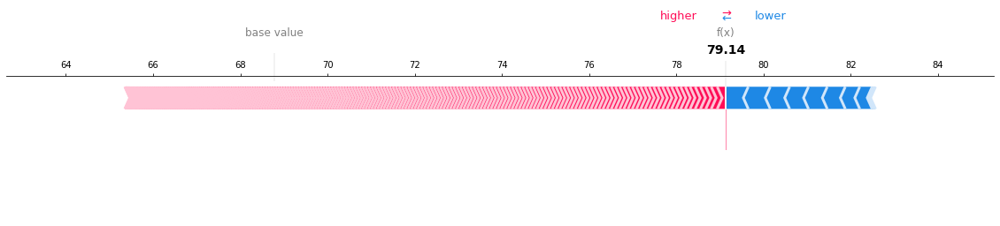

In [55]:
shap.force_plot(explainer.expected_value, shap_values[192:193], 
                feature_names=feature_names, matplotlib=True, show=False)
plt.savefig(f'{datetime.now()}.png', format='png', bbox_inches='tight')
plt.show()

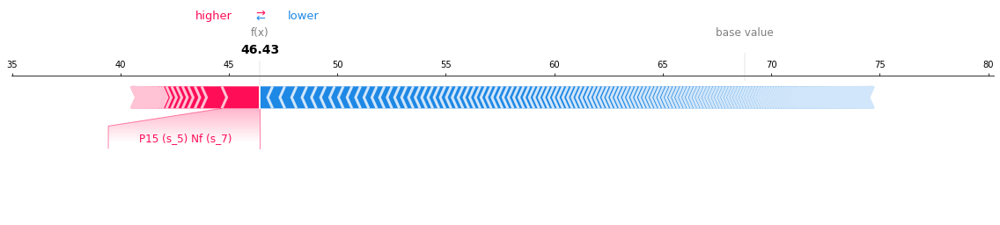

In [56]:
shap.force_plot(explainer.expected_value, shap_values[192+240], 
                feature_names=feature_names, matplotlib=True, show=False)
plt.savefig(f'{datetime.now()}.png', format='png', bbox_inches='tight')
plt.show()

# Model (ANN-3)

In [40]:
CLIP=80

model = MLPWrapperRegressor(
        clip_y=CLIP, scaler=StandardScaler(), poly_degree=1,
        basemodel=
            KerasRegressor(model=create_model,
                           batch_size=387,
                           epochs=37,
                           model__activation1='tanh',
                           model__activation2='relu',
                           model__activation3='elu',
                           model__dropout1=0.6025012184092352, 
                           model__dropout2=0.584225016100644, 
                           model__dropout3=0.6585832537238048, 
                           model__layer1=462, 
                           model__layer2=287, 
                           model__layer3=383,  
                           model__learning_rate=0.0047806961601746184,
                           model__optim=Adam,
                           validation_split=0.5866937471711482, 
                           verbose=0, callbacks=[es, printerCallback],
                           model__metrics=[RMSE(), R2()],
                           model__loss='mse',
                           print_summary=True
                           )
    )
model.fit(X_train_, y_train)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 462)               10164     
                                                                 
 dropout (Dropout)           (None, 462)               0         
                                                                 
 dense_1 (Dense)             (None, 287)               132881    
                                                                 
 dropout_1 (Dropout)         (None, 287)               0         
                                                                 
 dense_2 (Dense)             (None, 383)               110304    
                                                                 
 dropout_2 (Dropout)         (None, 383)               0         
                                                                 
 dense_3 (Dense)             (None, 1)                 3

MLPWrapperRegressor(basemodel=KerasRegressor(batch_size=387, callbacks=[<keras.callbacks.EarlyStopping object at 0x7f6f8f5d2210>, <keras.callbacks.LambdaCallback object at 0x7f6f8f5cda50>], epochs=37, model=<function create_model at 0x7f6f8f5caa70>, model__activation1='tanh', model__activation2='relu', model__activation3='elu', model__dropout1=0.6025012184092352, mo...model__learning_rate=0.0047806961601746184, model__loss='mse', model__metrics=[<keras.metrics.metrics.RootMeanSquaredError object at 0x7f6fe8e50810>, <tensorflow_addons.metrics.r_square.RSquare object at 0x7f6f8f673850>], model__optim=<class 'keras.optimizers.optimizer_v2.adam.Adam'>, print_summary=True, validation_split=0.5866937471711482, verbose=0),
                    clip_y=80)

In [41]:
# Scaling and formatting test data
test_sc = scale_test(X_test,model)

# Clipping test labels
reclipped_y = y_test.copy()
if(CLIP > 0): reclipped_y = reclipped_y["RUL"].clip(upper=CLIP, inplace=False)

# Evaluation
eval.show_result(reclipped_y, model.basemodel.predict(test_sc))

R2=0.847,RMSE=-10.455


In [43]:
train_sc = scale_test(X_train_, model)
train_np = np.array(train_sc)
feature_names = train_sc.columns
explainer = shap.DeepExplainer(model.basemodel.model_, train_np)

# 1k: instant
# 6k: ~40s
# 21k (all): ~6min

shap_values = explainer.shap_values(train_np)
shap_values = shap_values[0]
explainer.expected_value = np.array(explainer.expected_value)
explainer.expected_value[0]

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
You have provided over 5k background samples! For better performance consider using smaller random sample.
`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


64.05829

In [44]:
shap_values.shape

(20631, 21)

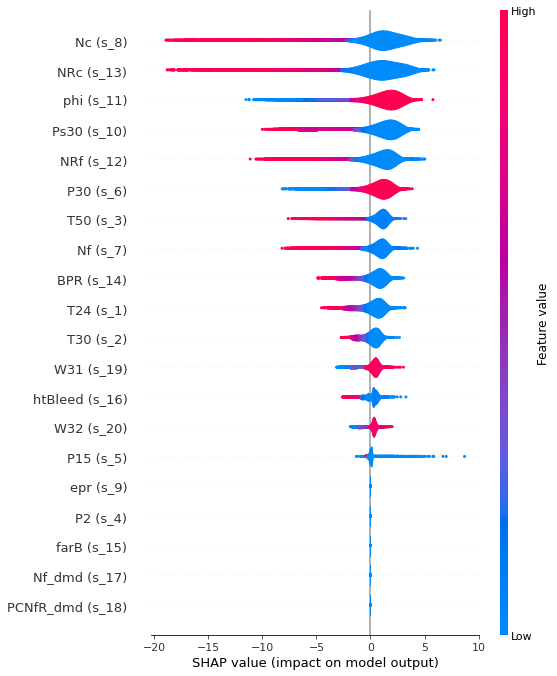

In [45]:
# shap.initjs()
shap.summary_plot(shap_values, train_np, plot_type="violin", 
                  feature_names=feature_names, show=False)
plt.savefig(f'{datetime.now()}.png', format='png', bbox_inches='tight')
plt.show()

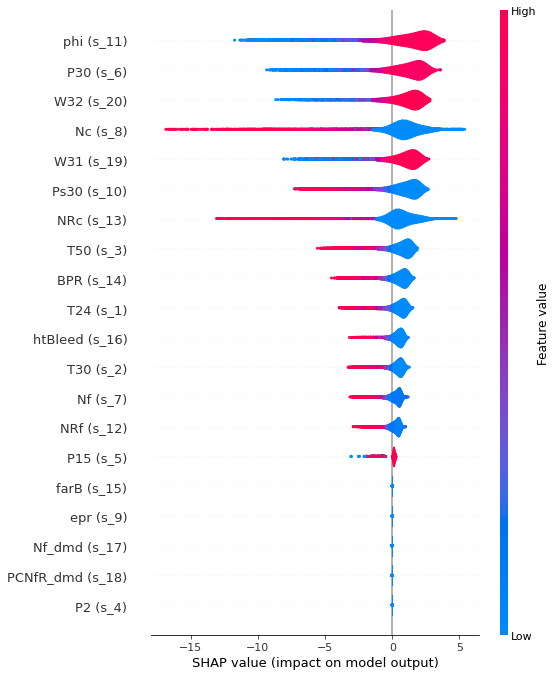

In [ ]:
# shap.initjs()
shap.summary_plot(shap_sma_5, train_np, plot_type="violin", 
                  feature_names=feature_names, show=False)
plt.savefig(f'{datetime.now()}.png', format='png', bbox_inches='tight')
plt.show()

In [46]:
from scipy.ndimage import uniform_filter

def get_start_end(i, train=train):
    grouped = train.groupby("unit_number").count()["time"]
    start = np.sum(grouped[:i-1])
    end = start + grouped[i]
    return start,end

def shap_plot_unit(i, shap_values=shap_values, explainer=explainer, feature_names=feature_names, train=train, sma_window=0):
    shap.initjs()
    start,end = get_start_end(i,train)
    return shap.force_plot(explainer.expected_value, 
                    uniform_filter(shap_values[start:end], size=(sma_window,1), mode='nearest'), 
                    feature_names=feature_names)

In [ ]:
shap_plot_unit(1)

In [ ]:
shap_plot_unit(1,sma_window=5)

In [47]:
shap_plot_unit(32)

In [48]:
shap_plot_unit(32,sma_window=5)

In [49]:
shap_plot_unit(32,sma_window=10)

In [50]:
shap_plot_unit(32,sma_window=20)

In [53]:
shap_plot_unit(42)

In [57]:
shap_plot_unit(42,sma_window=10)

In [58]:
get_start_end(42)

(8042, 8238)

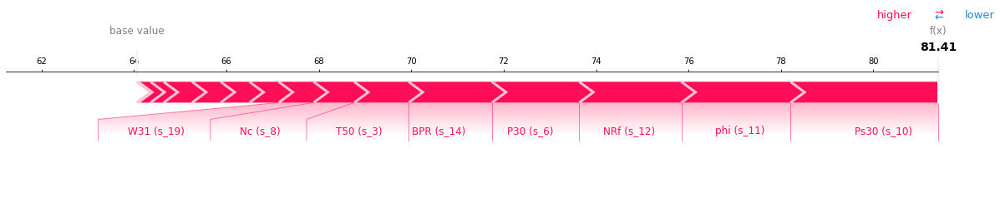

In [59]:
shap.force_plot(explainer.expected_value, shap_values[8043], 
                feature_names=feature_names, matplotlib=True, show=False)
plt.savefig(f'{datetime.now()}.png', format='png', bbox_inches='tight')
plt.show()

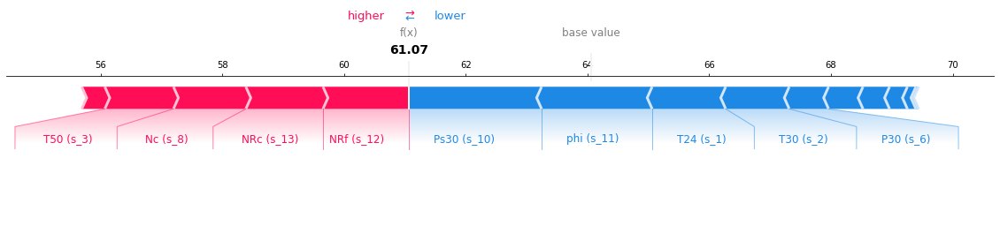

In [60]:
shap.force_plot(explainer.expected_value, shap_values[8042+155], 
                feature_names=feature_names, matplotlib=True, show=False)
plt.savefig(f'{datetime.now()}.png', format='png', bbox_inches='tight')
plt.show()

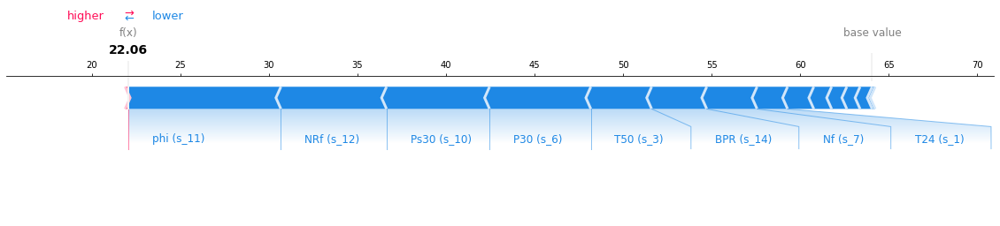

In [61]:
shap.force_plot(explainer.expected_value, shap_values[8042+185], 
                feature_names=feature_names, matplotlib=True, show=False)
plt.savefig(f'{datetime.now()}.png', format='png', bbox_inches='tight')
plt.show()